<a href="https://colab.research.google.com/github/Harshra1-ultra/CNN/blob/main/super_res_ESPCN(Efficient_Sub_Pixel_CNN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ESPCN(Efficient Sub-Pixel CNN)**

Approaches based on the convolutional neural network like SRCNN, FSRCNN, and VDSR have some drawbacks. Firstly, CNN approaches need to use interpolation methods to upsample the LR image, such as bicubic interpolation. Secondly, it increases the resolution before or at the first layer of the network. In other words, the CNN approach applies the convolutional neural network directly to the upsampled LR image, which will increase the computational complexity and memory cost.


In order to solve these problems, the new approach **ESPCN** has been proposed to add an efficient **sub-pixel convolutional layer** to the CNN network. ESPCN increases the resolution at the very end of the network. In ESPCN, the upscaling step is handled by the last layer, which means the smaller size LR image is directly fed to the network. Thus, there is no need to use the interpolation method. The network is capable of learning a better LR to HR mapping compared to an interpolation filter upscaling before feeding into the network. Due to the reduced input image size, a smaller filter size can be used to extract features. The computational complexity and memory cost is reduced so that the efficiency can be greatly enhanced. This is why ESPCN become an ideal choice for the super-resolution of HD videos in real-time.
**model architecture**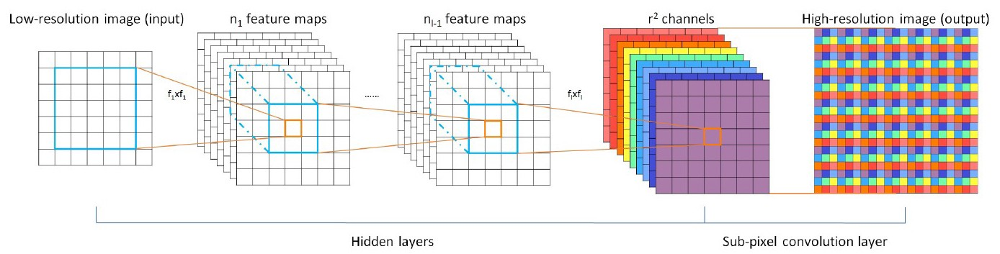

In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from keras import layers 
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

**LOADING BSD100 DATASET**
FOR IMAGE SUPER RESOLUTION TASK 

In [2]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

70778880/70763455 [==============================] - 85s 1us/step


CROPING IMAGE FOR MAKE TERAING DATASET 

In [3]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


In [4]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

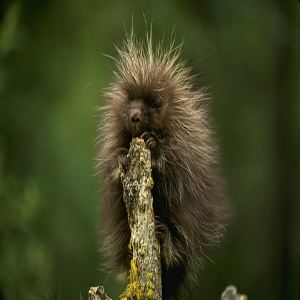

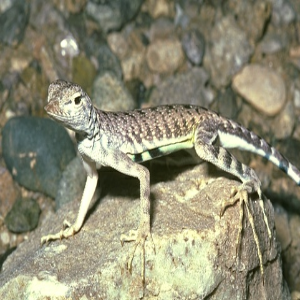

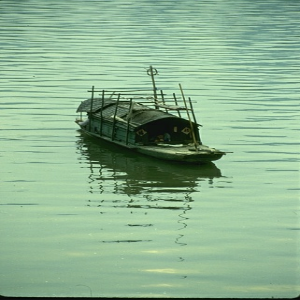

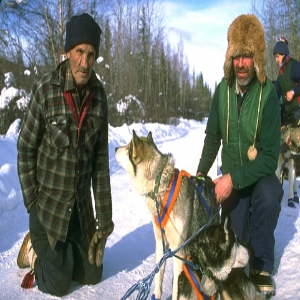

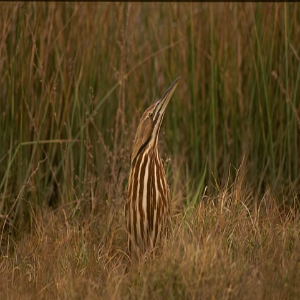

...

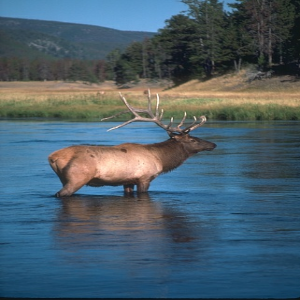

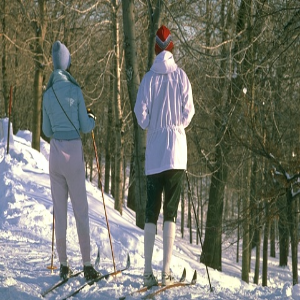

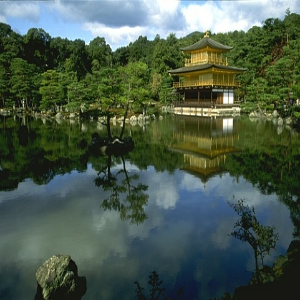

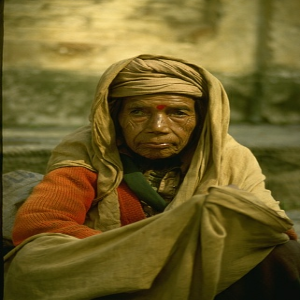

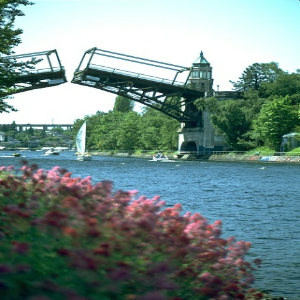

In [5]:
for batch in train_ds.take(3):
    for img in batch:
        display(array_to_img(img))

TRAIN SND TEST Data set 


In [6]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

**crop and resize**

---
as you can see in the results the data is downsampled to make low res for training and testing of image 


---



In [7]:

# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

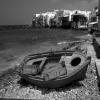

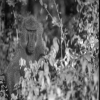

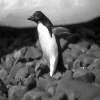

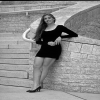

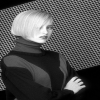

...

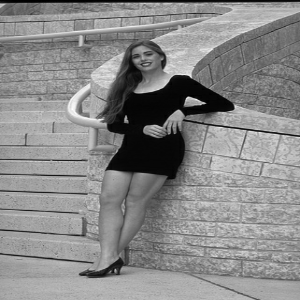

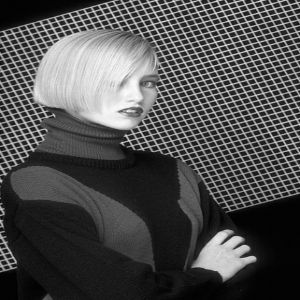

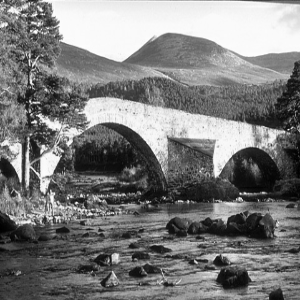

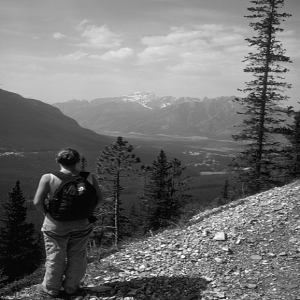

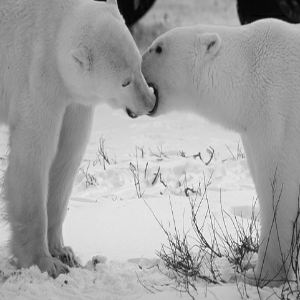

In [8]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

**MODEL Building**

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL

marking an image 
----
----
taking specific region of interest 



In [10]:
def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()

downsample 

In [11]:


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )



upsample of that image

In [12]:
def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

**MODEL**

Usually, the network has 3 layers, as shown in Figure 3:
1. The input image with shape [B, C, N, N]
2. First layer: convolutional layer with 64 filters and the kernel size of 5 × 5, followed by a tanh activation layer.
3. Second layer: convolutional layer with 32 filters and the kernel size of 3 × 3, followed by a tanh activation layer.
4. Third layer: convolutional layer with the fixed number of output channel C × r × r and the kernel size of 3 × 3.
5. Apply the sub-pixel shuffle function so that the output SR image will have the shape [B, C, r × N, r × N], followed by a sigmoid activation layer.


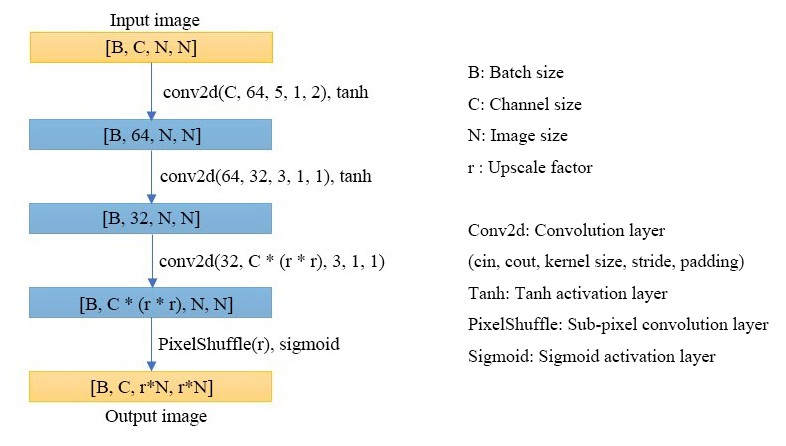





In [13]:
def get_model(upscale_factor=4, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)
    

In [18]:
from keras import layers
from keras.utils.vis_utils import plot_model

class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 2 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [19]:

early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()
plot_model(model,to_file='ESPCN.png',show_shapes=True)

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space_1 (TFOp (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_______________________________________________________

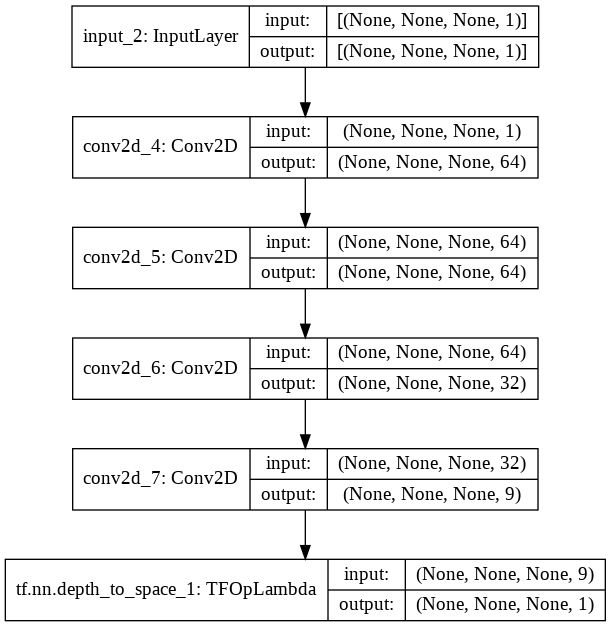

Epoch 1/10
Mean PSNR for epoch: 26.29


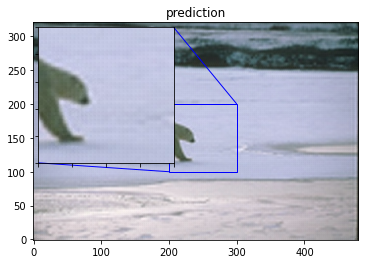

Epoch 2/10
Mean PSNR for epoch: 26.10
Epoch 3/10
Mean PSNR for epoch: 26.48


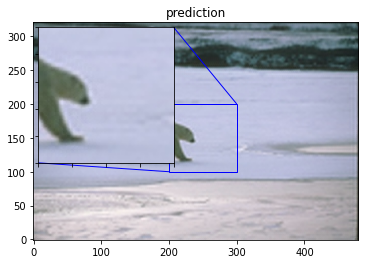

Epoch 4/10
Mean PSNR for epoch: 26.55
Epoch 5/10
Mean PSNR for epoch: 26.90


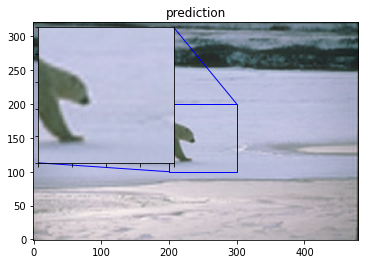

Epoch 6/10
Mean PSNR for epoch: 26.20
Epoch 7/10
Mean PSNR for epoch: 27.09


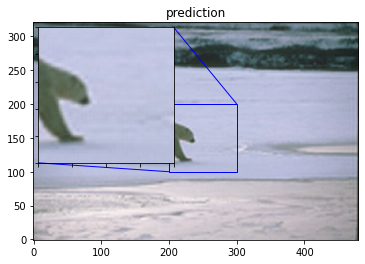

Epoch 8/10
Mean PSNR for epoch: 26.32
Epoch 9/10
Mean PSNR for epoch: 26.55


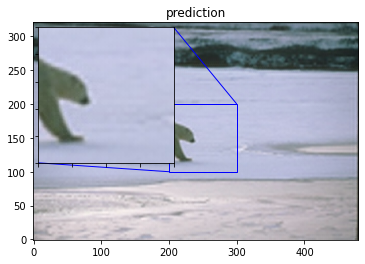

Epoch 10/10
Mean PSNR for epoch: 26.33


In [23]:
epochs = 10

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=6
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

#RESULTS

**Run model prediction and plot the results**
Let's compute the reconstructed version of a few images and save the results.



PSNR of low resolution image and high resolution image is 33.7648
PSNR of predict and high resolution is 33.2457


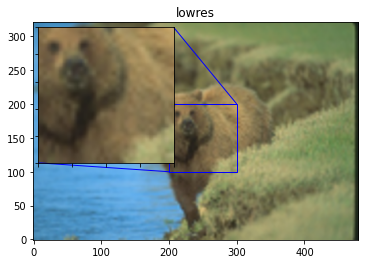

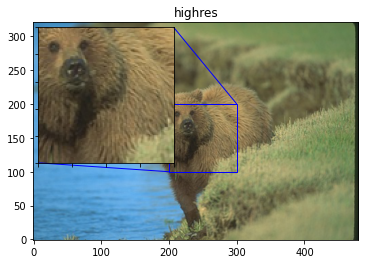

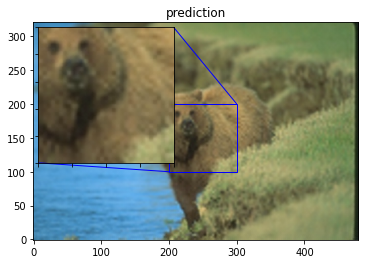

PSNR of low resolution image and high resolution image is 27.7062
PSNR of predict and high resolution is 28.0626


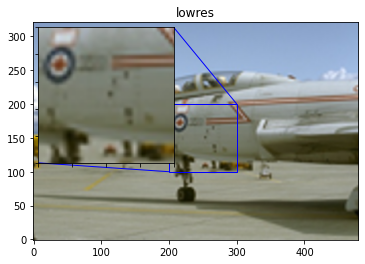

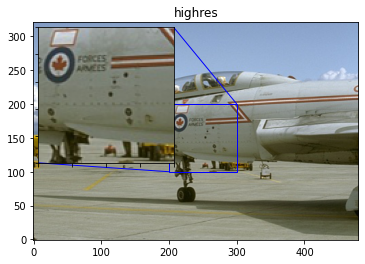

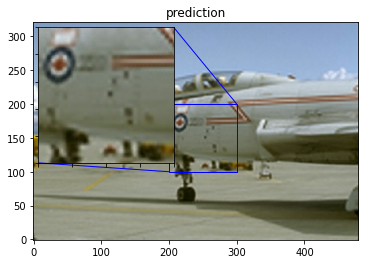

PSNR of low resolution image and high resolution image is 22.7002
PSNR of predict and high resolution is 23.1121


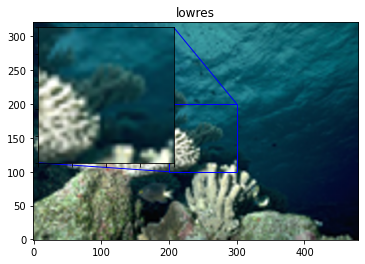

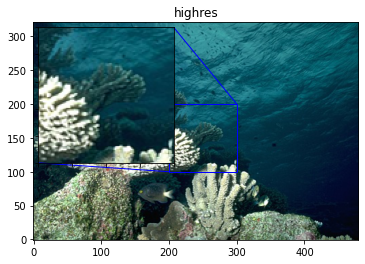

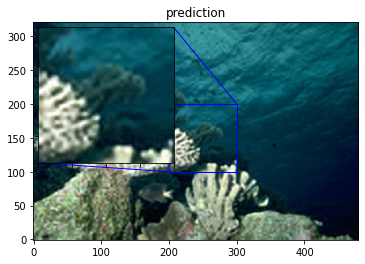

PSNR of low resolution image and high resolution image is 22.2816
PSNR of predict and high resolution is 22.6648


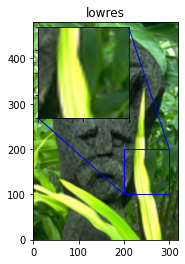

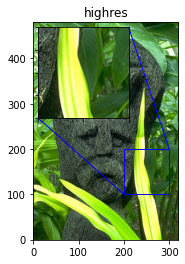

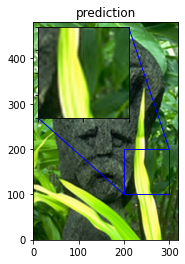

PSNR of low resolution image and high resolution image is 21.2786
PSNR of predict and high resolution is 21.5988


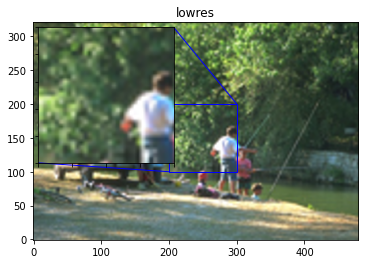

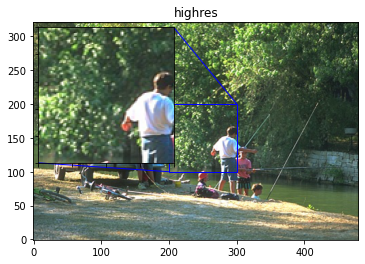

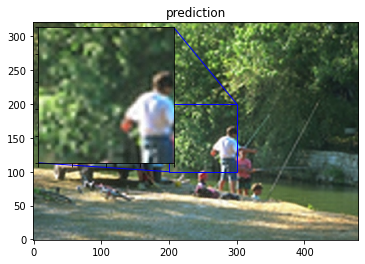

PSNR of low resolution image and high resolution image is 23.6220
PSNR of predict and high resolution is 24.0748


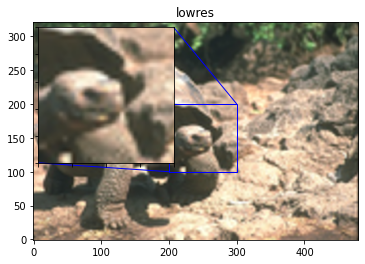

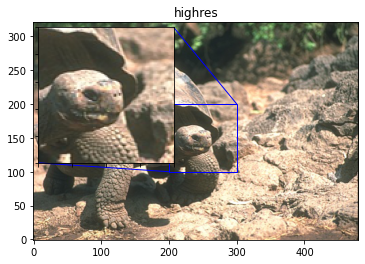

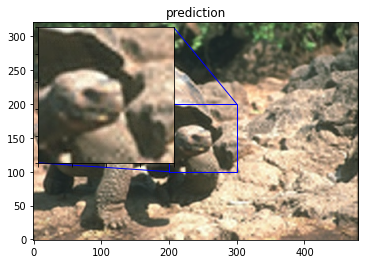

PSNR of low resolution image and high resolution image is 33.4889
PSNR of predict and high resolution is 33.6788


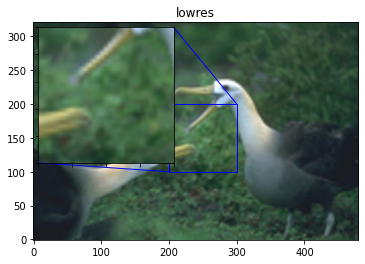

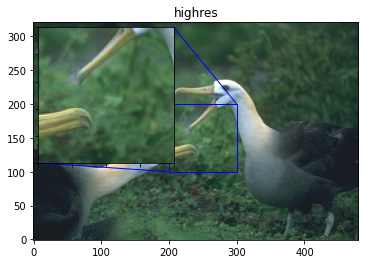

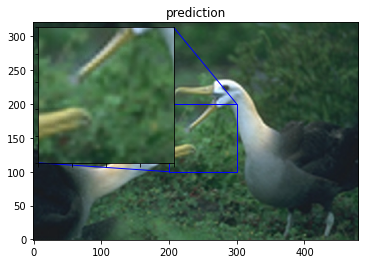

PSNR of low resolution image and high resolution image is 26.3507
PSNR of predict and high resolution is 26.7041


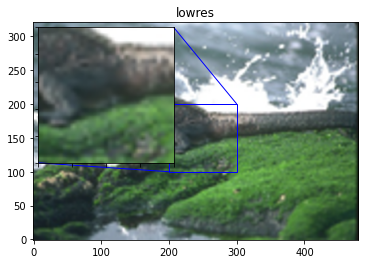

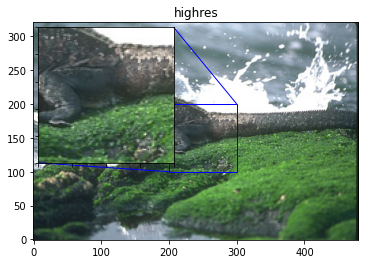

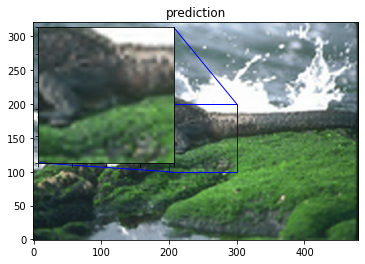

PSNR of low resolution image and high resolution image is 27.8790
PSNR of predict and high resolution is 28.1220


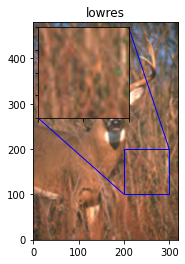

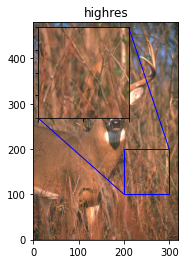

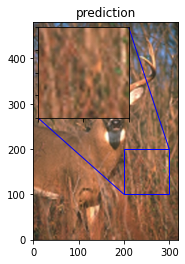

PSNR of low resolution image and high resolution image is 31.7775
PSNR of predict and high resolution is 31.6758


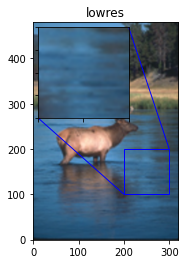

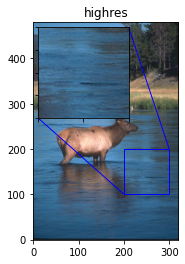

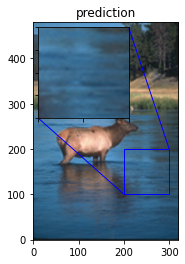

Avg. PSNR of lowres images is 27.0849
Avg. PSNR of reconstructions is 27.2940


In [24]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[2:12]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))